In [1]:
import numpy as np
from stdb import load_db 
import pygmt
import pandas as pd
import pickle
import glob, os
import warnings  
from obspy.core.event.catalog import read_events
warnings.filterwarnings("ignore")  

In [124]:
PKLpath = '/Volumes/home/Research/STEP/01_Split'
Path = '/Volumes/home/Research/STEP/05_Station_result_statistics'
SAVEpath = '/Volumes/home/Research/STEP/06_CIA_SWS_result/2010-2020_SKS_SKKS'

datapath = '/Volumes/home/Research/DataBase'
Volcano = f'{datapath}/01_Armenia/02_Volcano_list.csv'
fault = f'{datapath}/01_Armenia/00_smooth_fault_7.txt'
Turkey  = f'{datapath}/02_SKS_splitting/Lemnifi_etal_Turkey_stations_averaged_DB.txt'
Iran    = f'{datapath}/02_SKS_splitting/Arvin_etal_NW_Iran.txt'
MTurkey = f'{datapath}/02_SKS_splitting/Merry_etal_Turkey_2021_average.txt'
Kaviani = f'{datapath}/02_SKS_splitting/Kaviani2021_average.csv'
notplotLIST = ['TRLG','BRNG','GUDG']
nodataLIST = ['SEAG','DGRG','BGLV']


YearRange = '2010-2020'
csvfile = f'/Volumes/home/Research/STEP/05_Station_result_statistics-220916/Station_SK(K)S_2010-2020average_v7.csv'
ver=2

In [121]:
def PygmtBegin(figmap, region):
    figmap.basemap(region=region, projection="M15c", frame = ['x1f0.5', 'y1f0.5', f'nSeW'])
    figmap.grdimage('@earth_relief_15s',region =region, cmap="/Volumes/home/Research/Python/eleva.cpt",monochrome=True, shading=True, transparency=60)
    figmap.coast(resolution = 'h', shorelines ='1/thinnest,black', water='white', borders = '1/0.25p')
#     figmap.plot(data=smooth_fault,pen='1p,brown')
    Volcano = '/Volumes/home/Research/DataBase/01_Armenia/02_Volcano_list.csv'
    dv = pd.read_csv(Volcano)
    dv_ = dv[dv['Plottype']==1]
    figmap.plot(x=dv_['lon'],y=dv_['lat'],style="kvolcano/0.4c", pen='0.1p,black', color="black")
    dv__ = dv[dv['Plottype']==3]
    figmap.plot(x=dv__['lon'],y=dv__['lat'],style="kvolcano/0.4c", pen='0.1p,', color="120")    
    figmap.plot(data='box.txt',color='white@30')
    legenddata=[[44.4, 44.3, 0, 5, 0.5*40],[45.5, 44.3, 0, 5, 1*40],[46.7, 44.3, 0, 5, 1.5*40]]
    figmap.plot(data=legenddata, style="J", color="black", pen="0.01p,black")
    figmap.text(x=44.8,y=44.3,text='0.5s', font="10p,Times-Bold,black")
    figmap.text(x=46,y=44.3,text='1s', font="10p,Times-Bold,black")
    figmap.text(x=47.5,y=44.3,text='1.5s', font="10p,Times-Bold,black")
    SCdata = [[46.7, 44, 0, 5, 1.5*40]]
    figmap.plot(data=SCdata, style="J", color="red3", pen="0.01p,black")
    figmap.text(x=47.5,y=44,text='SC', font="10p,Times-Bold,black" )
    RCdata = [[46.7, 43.8, 0, 5, 1.5*40]]
    figmap.plot(data=RCdata, style="J", color="dodgerblue", pen="0.01p,black")
    figmap.text(x=47.5,y=43.8,text='RC', font="10p,Times-Bold,black")
    
    Merrydata = [[46.7, 43.6, 0, 5, 1.5*40]]
    figmap.plot(data=Merrydata, style="J", color="193/205/205", pen="0.02p,black")
    figmap.text(x=46.3,y=43.45,text='Merry et al., (2021)', font="9p,4,black",justify='LM')      
    Turkeydata = [[46.7, 43.25, 0, 5, 1.5*40]]
    figmap.plot(data=Turkeydata, style="J", color="238/223/204", pen="0.02p,black")
    figmap.text(x=46.3,y=43.10,text='Lemnifi et al., (2017)', font="9p,4,black",justify='LM')
    Irandata = [[46.7, 43.0, 0, 5, 1.5*40]]
    figmap.plot(data=Irandata, style="J", color="238/203/173", pen="0.02p,black")
    figmap.text(x=46.3,y=42.85,text='Arvin et al., (2021)', font="9p,4,black",justify='LM')
    kavianidata = [[46.7, 42.7, 0, 5, 1.5*40]]
    figmap.plot(data=kavianidata, style="J", color="216/191/216", pen="0.02p,black")
    figmap.text(x=46.3,y=42.55,text='Kaviani et al., (2021)', font="9p,4,black",justify='LM')        
    
    figmap.plot(x=44.35, y=44, style="c0.25c", color='white', pen="0.5p,40")
    figmap.text(x=44.315, y=44, text='1',justify='LM', font="8p,Times-Bold,black")
    figmap.text(x=44.55, y=44, text='non-Null',justify='LM', font="10p,Times-Bold,black")    
    figmap.text(x=44.55, y=43.8, text='w/ number',justify='LM', font="10p,Times-Bold,black") 
    
    figmap.plot(x=44.35, y=43.5, style="c0.25c", color='white', pen="0.5p,40")
    figmap.text(x=44.55, y=43.5, text='Null',justify='LM', font="10p,Times-Bold,black")
    figmap.plot(x=44.35, y=43.2, style="c0.25c", color='180', pen="0.5p,40")
    figmap.text(x=44.55, y=43.2, text='No enough data',justify='LM', font="10p,Times-Bold,black")
    
    figmap.plot(x=46.4,y=42.35,style="kvolcano/0.3c", pen='0.1p,black', color="black") 
    figmap.text(x=46.55, y=42.35, text='Holocene',justify='LM', font="10p,4,black")
    figmap.plot(x=46.4,y=42.15,style="kvolcano/0.3c", pen='0.1p,black', color="120") 
    figmap.text(x=46.55, y=42.15, text='Pleistocene',justify='LM', font="10p,4,black")

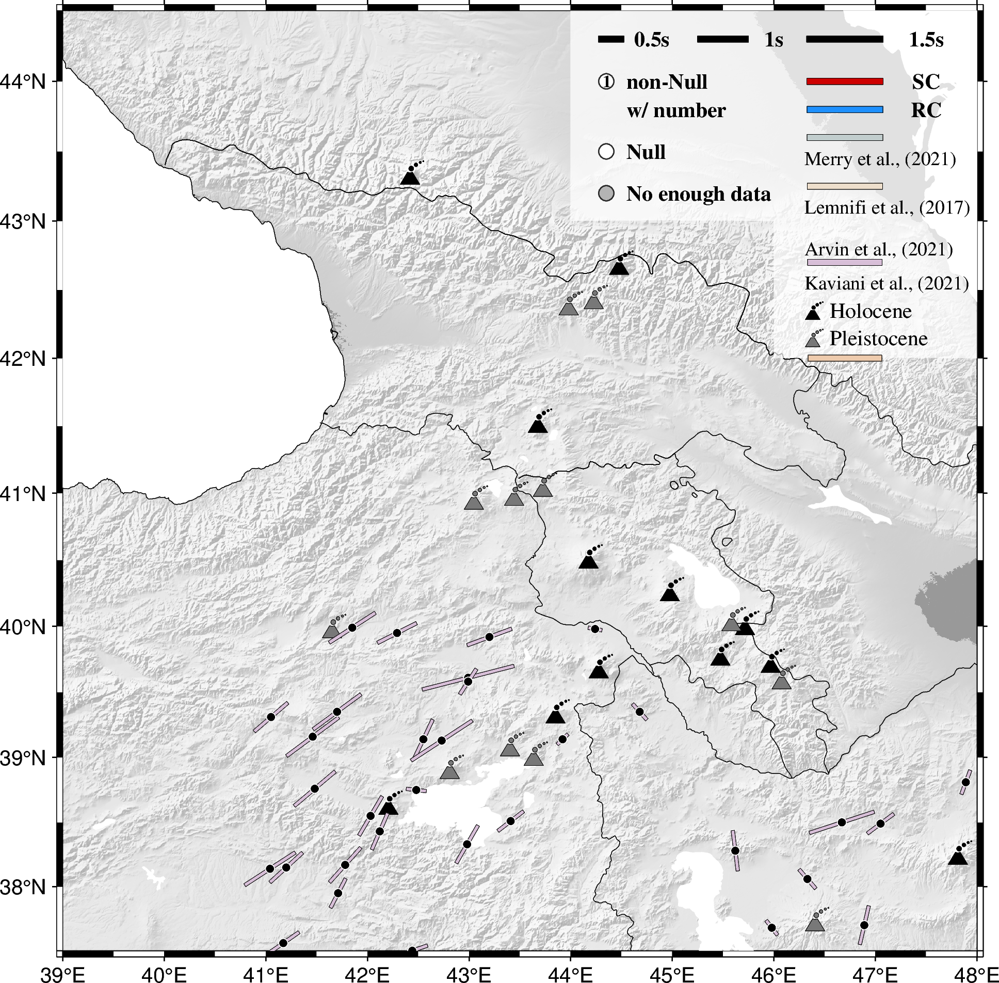

In [116]:
figmap = pygmt.Figure()
PygmtBegin(figmap, regvals)
dK = pd.read_csv(Kaviani)
for k in range(len(dK)):
    if dK['stlon'][k] <48 and dK['stlat'][k] >37 : 
        data = [[dK['stlon'][k], dK['stlat'][k], dK['phi'][k]-90, 3, dK['dt'][k]*40]]
        figmap.plot(data=data, style="J", color="216/191/216", pen="0.01p,black")
        figmap.plot(x=dK['stlon'][k],y=dK['stlat'][k],style="c0.15c",color='black', pen="white")

figmap.show()

XG.CMCY
XG.DGRL
BI.MAKU


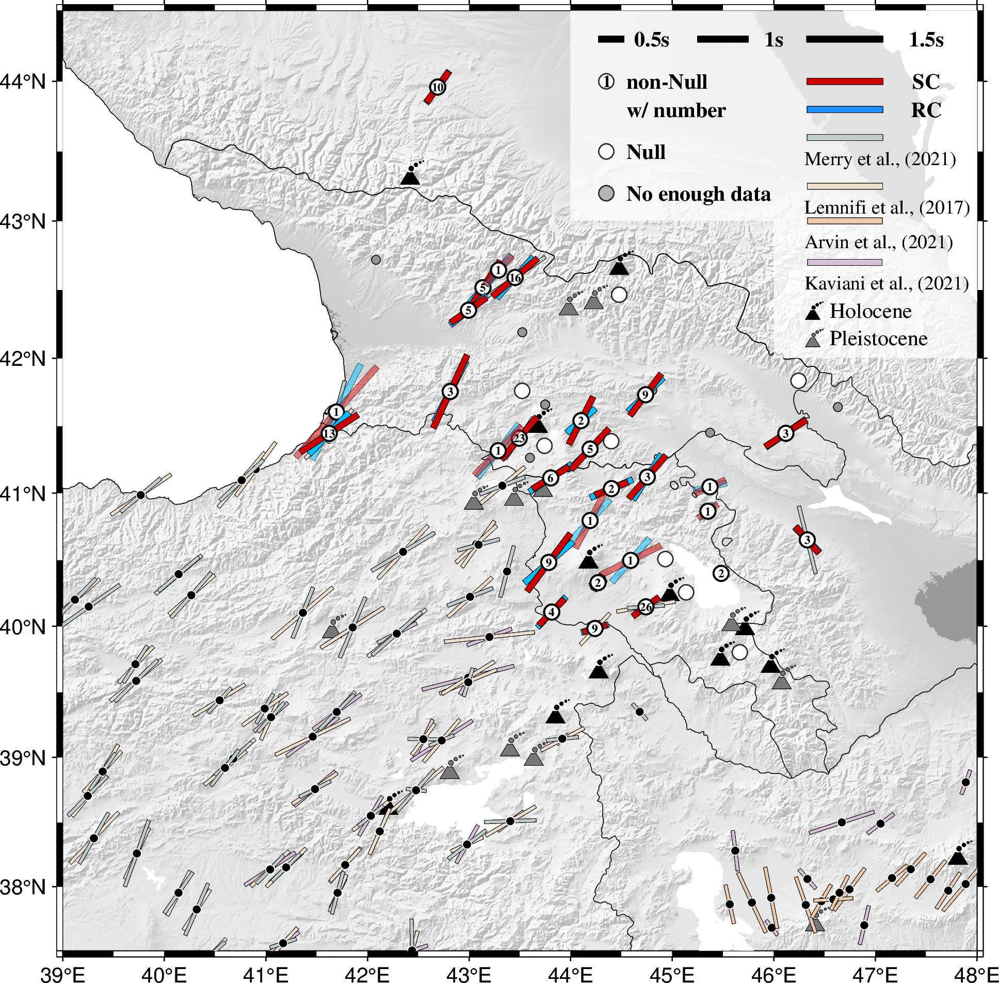

In [122]:
##==================for non-Null Good condition 
# Ori_Event = Event_clean()
regvals = [39, 48, 37.5, 44.5]
figmap = pygmt.Figure()
PygmtBegin(figmap, regvals)

figmap.plot()
dK = pd.read_csv(Kaviani)
for k in range(len(dK)):
    if dK['stlon'][k] <48 and dK['stlat'][k] >37 : 
        data = [[dK['stlon'][k], dK['stlat'][k], dK['phi'][k]-90, 3, dK['dt'][k]*40]]
        figmap.plot(data=data, style="J", color="216/191/216", pen="0.01p,black")
        figmap.plot(x=dK['stlon'][k],y=dK['stlat'][k],style="c0.15c",color='black', pen="white")
dt = pd.read_csv(Turkey,sep='\s+',names=['station','lat','lon','phi','stdphi','dt','stddt','num'])
for t in range(len(dt)):
    if dt['lon'][t] > 39 and dt['lat'][t] >37 : 
        data = [[dt['lon'][t], dt['lat'][t], dt['phi'][t]-90, 3, dt['dt'][t]*40]]
        figmap.plot(data=data, style="J", color="238/223/204", pen="0.01p,black")
        figmap.plot(x=dt['lon'][t],y=dt['lat'][t],style="c0.15c",color='black', pen="white")
dI = pd.read_csv(Iran,sep='\s+')
for t in range(len(dI)):
    if dI['Longitude'][t] < 48 and dI['Latitude'][t] >37 and dI['FPD'][t] != '-': 
        data = [[dI['Longitude'][t], dI['Latitude'][t], float(dI['FPD'][t])-90, 3, float(dI['dt'][t])*40]]
        figmap.plot(data=data, style="J", color="238/203/173", pen="0.01p,black")
        figmap.plot(x=dI['Longitude'][t],y=dI['Latitude'][t],style="c0.15c",color='black', pen="white")
dM = pd.read_csv(MTurkey,sep='\s+')
for m in range(len(dM)):
    if dM['Lon.'][m] > 39 and dM['Lat.'][m] >37 and dM['PHI'][m]!='-' : 
        data = [[dM['Lon.'][m], dM['Lat.'][m], float(dM['PHI'][m])-90, 3, float(dM['TLAG'][m])*40]]
        figmap.plot(data=data, style="J", color="193/205/205", pen="0.01p,black")
        figmap.plot(x= dM['Lon.'][m],y=dM['Lat.'][m],style="c0.15c",color='black', pen="white")

df = pd.read_csv(csvfile)
for STApath in glob.glob(f'{PKLpath}/*.pkl'):
    STApkl = pickle.load(open(STApath, "rb"))
    values = [value for keys, value in STApkl.items() ][0]
    
    NET = values['network']; STA = values['station']
    st_lat = values['latitude']; st_lon = values['longitude']
    NetSta = f'{NET}.{STA}'
    try:
        df_ = df[df['Station']==NetSta]
        RCphi  = df_['RCphi'].values[0]
        RCdphi = df_['RCdphi'].values[0]
        RCdt   = df_['RCdt'].values[0]
        RCddt  = df_['RCddt'].values[0]
        SCphi  = df_['SCphi'].values[0]
        SCdphi = df_['SCphi'].values[0]
        SCdt   = df_['SCdt'].values[0]
        SCddt  = df_['SCddt'].values[0]
        nonNull= df_['nonNull'].values[0]
        Null   = df_['Null'].values[0]
        numSKS = nonNull+Null
        if nonNull > 0 :
            if nonNull <2: t = 50
            else: t = 0
            RCdata = [[st_lon, st_lat, RCphi-90, 5, RCdt*40]]
            figmap.plot(data=RCdata, style="J", color="deepskyblue1", pen="0.1p,black",transparency=t)   
            SCdata = [[st_lon, st_lat, SCphi-90, 5, SCdt*40]]
            figmap.plot(data=SCdata, style="J", color="red3", pen="0.1p,black",transparency=t) 
            figmap.plot(x=st_lon, y=st_lat,style="c0.25c",color='white' ,pen="0.8p,black")
            figmap.text(x=st_lon,y=st_lat,text=nonNull, font="5.5p,Times-Bold,black")
        else:
            if numSKS>3:
                figmap.plot(x=st_lon, y=st_lat, style="c0.25c", color='white', pen="0.5p,40")
            else:
                figmap.plot(x=st_lon, y=st_lat, style="c0.15c",color='grey59', pen="black")
    except:
        print(NetSta)
figmap.show()
figmap.savefig('AverageResult_2method.png',dpi=200)
figmap.savefig('AverageResult_2method.pdf')


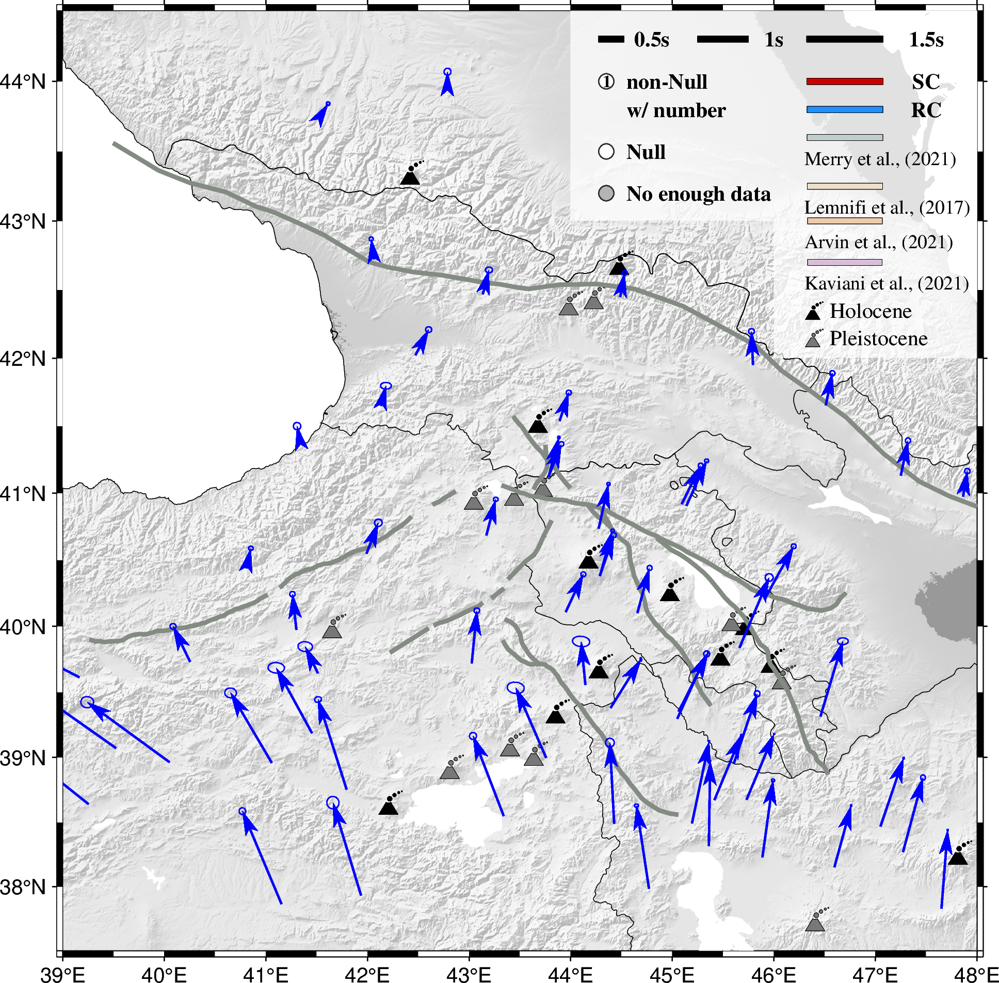

In [157]:
figmap = pygmt.Figure()
PygmtBegin(figmap, regvals)

figmap.plot(data = fault,pen='2p,131/139/131')
figmap.velo(
    data='GPS_221020.txt',
    pen="0.5p,blue",
    line=False,
    spec="e0.1/0.2/20",
    vector="0.4c+p1p+e+gblue",
)

figmap.show()


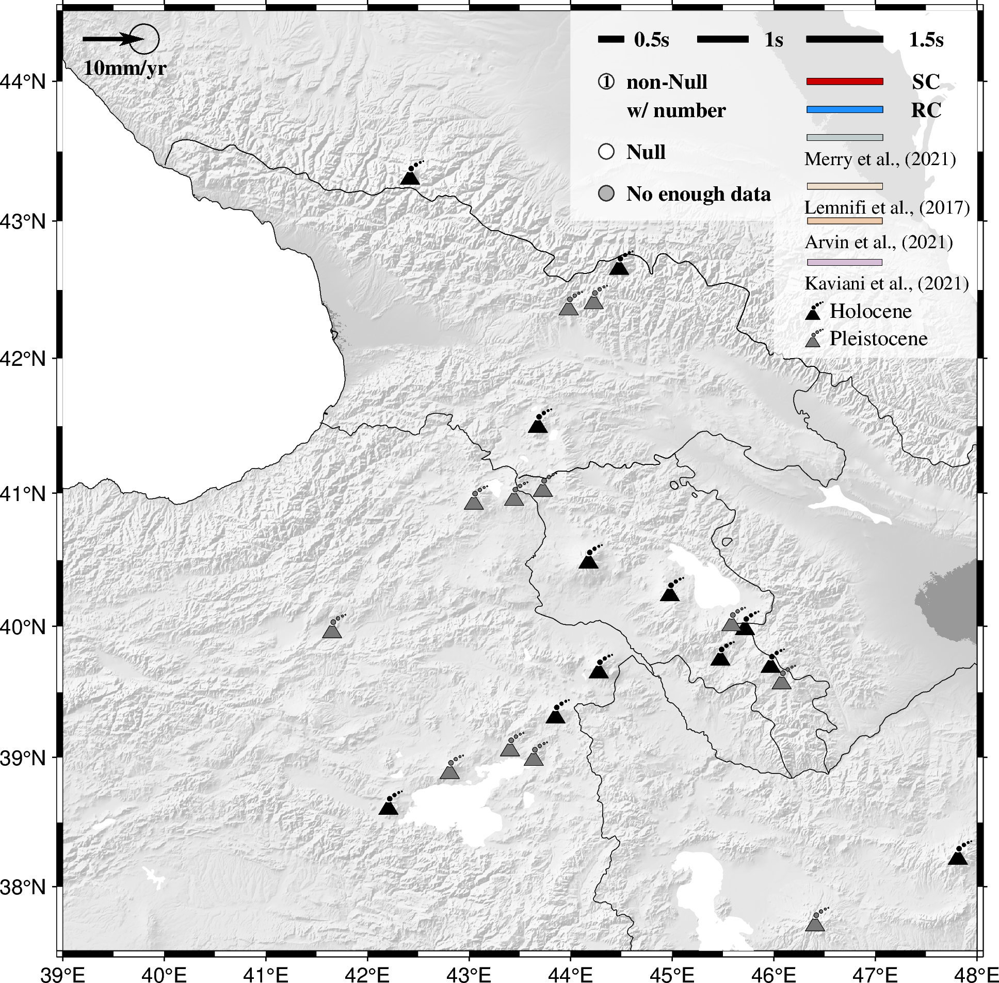

In [164]:
figmap = pygmt.Figure()
PygmtBegin(figmap, regvals)


data = [[39.2, 44.3, 10, 0, 1, 1]]
figmap.velo(
    data=data,
    pen="0.5p,black",
    line=False,
    spec="e0.1/0.95/0",
    vector="0.4c+p2p+e+gblack")
figmap.text(x=39.18,y=44.1,text='10mm/yr',justify='LM',font="10p,Times-Bold,black")
figmap.show()


In [132]:
GPS_Reilinger = f'{datapath}/03_Reilinger_R_etal_GPS_relativeEurasia/jgrb14718-sup-0002-ts01.txt'
GPS_Iran = f'{datapath}/Iran_GPS_velocity.csv'
GPS_AM = f'{datapath}/01_Armenia/03_Armenia_GPS_velocity.csv'

cmd = '''awk -F, 'NR>1 {print $2,$3,$4,$5,$6,$7,$8}' %(GPS_Iran)s > temp1.out''' %locals()
os.system(cmd)
cmd = '''awk 'NR>1 {print $2,$3,$4,$5,$6,$7,$8}' %(GPS_Reilinger)s > temp2.out''' %locals()
os.system(cmd)
cmd = '''awk -F, 'NR>1 {print $1,$2,$3,$4,$5,$6,$7}' %(GPS_AM)s >temp3.out''' %locals()
os.system(cmd)

0

## GPS&fault

XG.CMCY
XG.DGRL
BI.MAKU


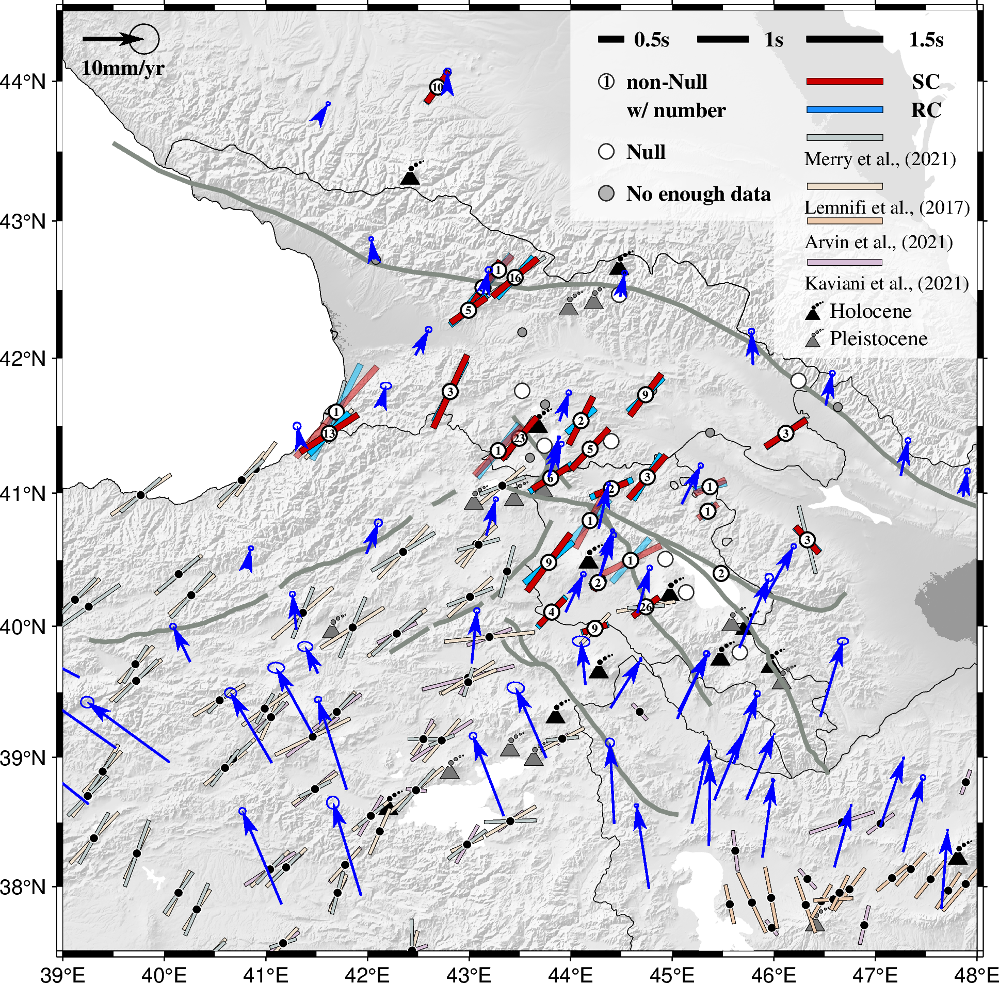

In [165]:
##==================for non-Null Good condition 
# Ori_Event = Event_clean()
regvals = [39, 48, 37.5, 44.5]
figmap = pygmt.Figure()
PygmtBegin(figmap, regvals)

figmap.plot(data = fault,pen='2p,131/139/131')
figmap.velo(
    data='GPS_221020.txt',
    pen="0.5p,blue",
    line=False,
    spec="e0.1/0.2/20",
    vector="0.4c+p1p+e+gblue",
)

dK = pd.read_csv(Kaviani)
for k in range(len(dK)):
    if dK['stlon'][k] <48 and dK['stlat'][k] >37 : 
        data = [[dK['stlon'][k], dK['stlat'][k], dK['phi'][k]-90, 3, dK['dt'][k]*40]]
        figmap.plot(data=data, style="J", color="216/191/216", pen="0.01p,black")
        figmap.plot(x=dK['stlon'][k],y=dK['stlat'][k],style="c0.15c",color='black', pen="white")
dt = pd.read_csv(Turkey,sep='\s+',names=['station','lat','lon','phi','stdphi','dt','stddt','num'])
for t in range(len(dt)):
    if dt['lon'][t] > 39 and dt['lat'][t] >37 : 
        data = [[dt['lon'][t], dt['lat'][t], dt['phi'][t]-90, 3, dt['dt'][t]*40]]
        figmap.plot(data=data, style="J", color="238/223/204", pen="0.01p,black")
        figmap.plot(x=dt['lon'][t],y=dt['lat'][t],style="c0.15c",color='black', pen="white")
dI = pd.read_csv(Iran,sep='\s+')
for t in range(len(dI)):
    if dI['Longitude'][t] < 48 and dI['Latitude'][t] >37 and dI['FPD'][t] != '-': 
        data = [[dI['Longitude'][t], dI['Latitude'][t], float(dI['FPD'][t])-90, 3, float(dI['dt'][t])*40]]
        figmap.plot(data=data, style="J", color="238/203/173", pen="0.01p,black")
        figmap.plot(x=dI['Longitude'][t],y=dI['Latitude'][t],style="c0.15c",color='black', pen="white")
dM = pd.read_csv(MTurkey,sep='\s+')
for m in range(len(dM)):
    if dM['Lon.'][m] > 39 and dM['Lat.'][m] >37 and dM['PHI'][m]!='-' : 
        data = [[dM['Lon.'][m], dM['Lat.'][m], float(dM['PHI'][m])-90, 3, float(dM['TLAG'][m])*40]]
        figmap.plot(data=data, style="J", color="193/205/205", pen="0.01p,black")
        figmap.plot(x= dM['Lon.'][m],y=dM['Lat.'][m],style="c0.15c",color='black', pen="white")

df = pd.read_csv(csvfile)
for STApath in glob.glob(f'{PKLpath}/*.pkl'):
    STApkl = pickle.load(open(STApath, "rb"))
    values = [value for keys, value in STApkl.items() ][0]
    
    NET = values['network']; STA = values['station']
    st_lat = values['latitude']; st_lon = values['longitude']
    NetSta = f'{NET}.{STA}'
    try:
        df_ = df[df['Station']==NetSta]
        RCphi  = df_['RCphi'].values[0]
        RCdphi = df_['RCdphi'].values[0]
        RCdt   = df_['RCdt'].values[0]
        RCddt  = df_['RCddt'].values[0]
        SCphi  = df_['SCphi'].values[0]
        SCdphi = df_['SCphi'].values[0]
        SCdt   = df_['SCdt'].values[0]
        SCddt  = df_['SCddt'].values[0]
        nonNull= df_['nonNull'].values[0]
        Null   = df_['Null'].values[0]
        numSKS = nonNull+Null
        if nonNull > 0 :
            if nonNull <2: t = 50
            else: t = 0
            RCdata = [[st_lon, st_lat, RCphi-90, 5, RCdt*40]]
            figmap.plot(data=RCdata, style="J", color="deepskyblue1", pen="0.1p,black",transparency=t)   
            SCdata = [[st_lon, st_lat, SCphi-90, 5, SCdt*40]]
            figmap.plot(data=SCdata, style="J", color="red3", pen="0.1p,black",transparency=t) 
            figmap.plot(x=st_lon, y=st_lat,style="c0.25c",color='white' ,pen="0.8p,black")
            figmap.text(x=st_lon,y=st_lat,text=nonNull, font="5.5p,Times-Bold,black")
        else:
            if numSKS>3:
                figmap.plot(x=st_lon, y=st_lat, style="c0.25c", color='white', pen="0.5p,40")
            else:
                figmap.plot(x=st_lon, y=st_lat, style="c0.15c",color='grey59', pen="black")
    except:
        print(NetSta)
        
figmap.velo(
    data='GPS_221020.txt',
    pen="0.5p,blue",
    line=False,
    spec="e0.1/0.2/20",
    vector="0.4c+p1p+e+gblue")

data = [[39.2, 44.3, 10, 0, 1, 1]]
figmap.velo(
    data=data,
    pen="0.5p,black",
    line=False,
    spec="e0.1/0.95/0",
    vector="0.4c+p2p+e+gblack")
figmap.text(x=39.18,y=44.1,text='10mm/yr',justify='LM',font="10p,Times-Bold,black")

figmap.show()
figmap.savefig('AverageResult_2method_GPSfault.png',dpi=200)
figmap.savefig('AverageResult_2method_GPSfault.pdf')


In [160]:
!open .